In [ ]:
#clones github repo containing object detection api
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3072, done.
remote: Counting objects: 100% (3072/3072), done.
remote: Compressing objects: 100% (2604/2604), done.
remote: Total 3072 (delta 762), reused 1330 (delta 425), pack-reused 0
Receiving objects: 100% (3072/3072), 33.32 MiB | 26.28 MiB/s, done.
Resolving deltas: 100% (762/762), done.


In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1679351 sha256=bd12634b152be29ab62616393c3d3885ca2781309c8267936e3a08021c02c44c
  Stored in directory: /tmp/pip-ephem-wheel-cache-f7ejb20e/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=178ad3e871f568a43bd32da29a320f96c08c3fff56f3ea8709f50993803885ec
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for avro-python3: filename=avro_python3-1.9.2.1-py3-none-any.whl size=43512 sha256=fe3262da084870ec58a89acb729a85ac1bd84097d5070bc727d2bf678ea28482
  Stored in directory: /root/.cache/pip/wheels/bc/49/5f/fdb5b9d85055c478213e0158ac122b596816149a02d82e0ab1
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78546 sha256=55766f939682c06a3c23c22eee61af8989cda7ae78a1c6f24

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


Testing our fine_tuned_model :

In [ ]:
# Import visualization libraries and object detection functions:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf##
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [ ]:
#label_map upload kro pehle
labelmap_path='/content/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#fine_tuned_model upload kro(zipped ho to unzip krna hai fir uska content bhi extra folder hai usme wo hatana hai)
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/content/gdrive/MyDrive/content/fine_tuned_model/saved_model')

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

**for images**

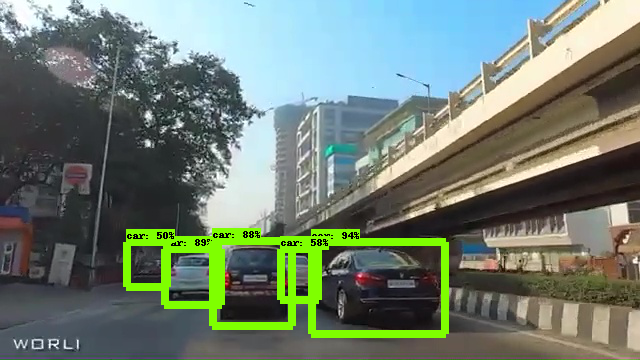

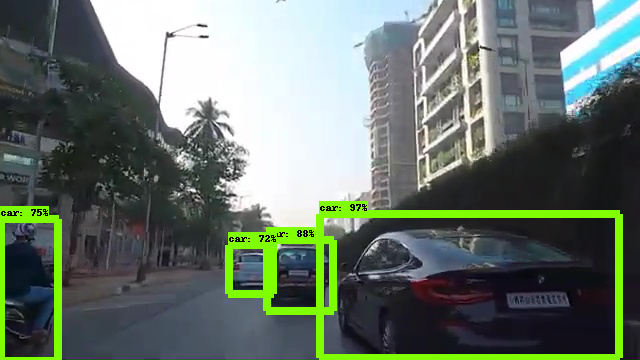

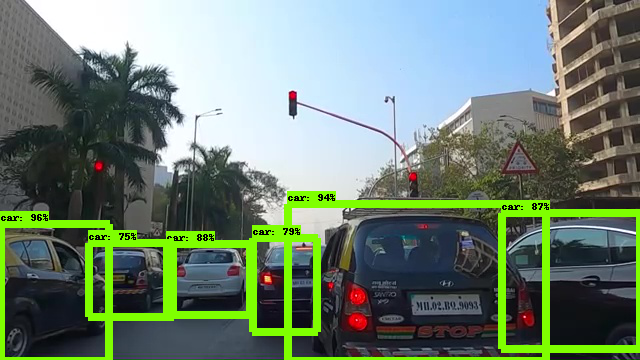

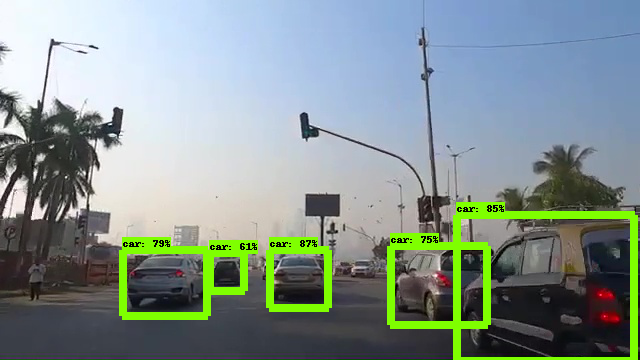

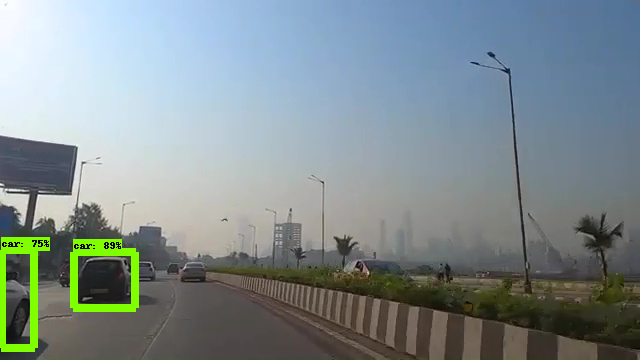

...

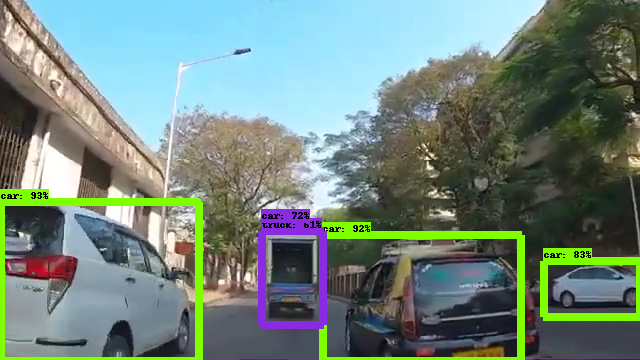

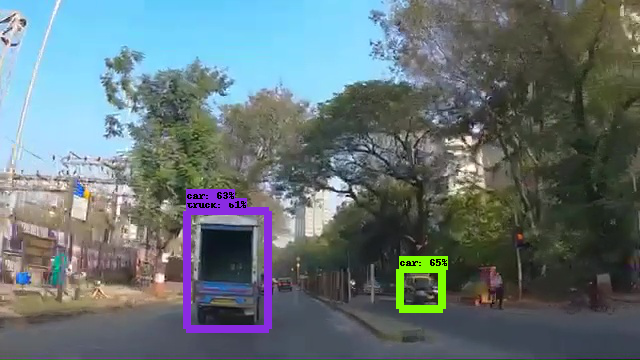

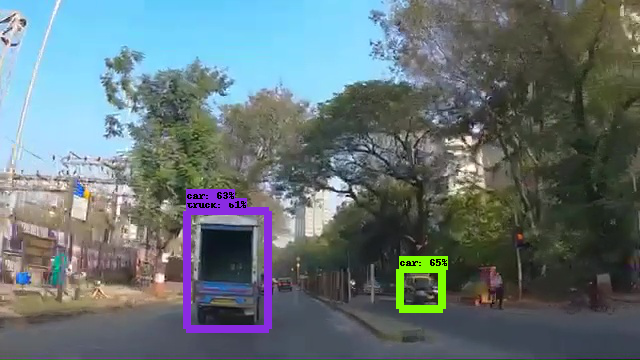

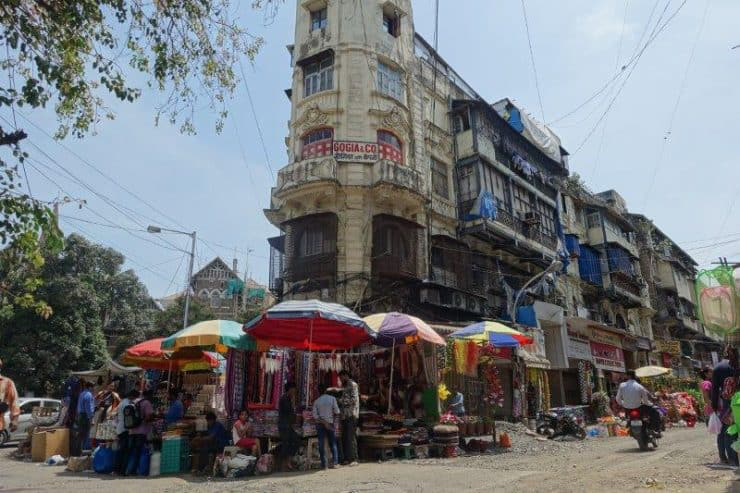

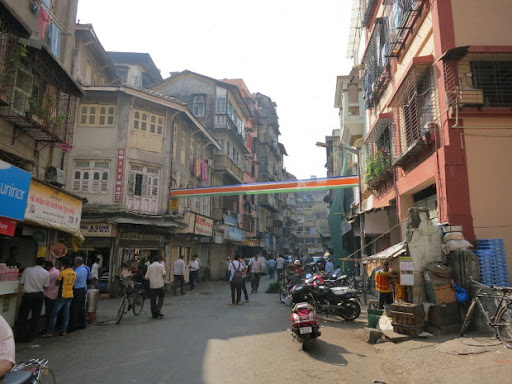

In [ ]:
#upload test images
#already uploaded in gdrive
for image_path in glob.glob('/content/gdrive/MyDrive/test/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))

**for videos**

In [ ]:
def show_inference(model, frame):
  #take the frame from video feed and convert that to array
  image_np = np.array(frame)
  # Actual detection.
     
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=5)
 
  return(image_np)

In [ ]:
#for output video
writer = cv2.VideoWriter("detection_output.avi", cv2.VideoWriter_fourcc('M','P','4','V'), 30,(640,360))

In [ ]:
#now let's try for the video
video_path='content/gdrive/MyDrive/driving.mp4'
import cv2
video_capture = cv2.VideoCapture(video_path)
while video_capture.isOpened():
    if ret:
    # Capture frame-by-frame
      ret,frame = video_capture.read()
      detectedImage=show_inference(model, frame.copy())
      writer.write(detectedImage) #write to video output stream
    else:
      break

writer.release()
video_capture.release()
